In [1]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier



In [2]:
load_iris()

{'data': array([[5.1, 3.5, 1.4, 0.2],
        [4.9, 3. , 1.4, 0.2],
        [4.7, 3.2, 1.3, 0.2],
        [4.6, 3.1, 1.5, 0.2],
        [5. , 3.6, 1.4, 0.2],
        [5.4, 3.9, 1.7, 0.4],
        [4.6, 3.4, 1.4, 0.3],
        [5. , 3.4, 1.5, 0.2],
        [4.4, 2.9, 1.4, 0.2],
        [4.9, 3.1, 1.5, 0.1],
        [5.4, 3.7, 1.5, 0.2],
        [4.8, 3.4, 1.6, 0.2],
        [4.8, 3. , 1.4, 0.1],
        [4.3, 3. , 1.1, 0.1],
        [5.8, 4. , 1.2, 0.2],
        [5.7, 4.4, 1.5, 0.4],
        [5.4, 3.9, 1.3, 0.4],
        [5.1, 3.5, 1.4, 0.3],
        [5.7, 3.8, 1.7, 0.3],
        [5.1, 3.8, 1.5, 0.3],
        [5.4, 3.4, 1.7, 0.2],
        [5.1, 3.7, 1.5, 0.4],
        [4.6, 3.6, 1. , 0.2],
        [5.1, 3.3, 1.7, 0.5],
        [4.8, 3.4, 1.9, 0.2],
        [5. , 3. , 1.6, 0.2],
        [5. , 3.4, 1.6, 0.4],
        [5.2, 3.5, 1.5, 0.2],
        [5.2, 3.4, 1.4, 0.2],
        [4.7, 3.2, 1.6, 0.2],
        [4.8, 3.1, 1.6, 0.2],
        [5.4, 3.4, 1.5, 0.4],
        [5.2, 4.1, 1.5, 0.1],
  

In [3]:
iris = load_iris(as_frame=True)

In [4]:
iris.data


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


In [5]:
type(iris.data)

pandas.core.frame.DataFrame

In [6]:
iris.data["petal length (cm)"]

0      1.4
1      1.4
2      1.3
3      1.5
4      1.4
      ... 
145    5.2
146    5.0
147    5.2
148    5.4
149    5.1
Name: petal length (cm), Length: 150, dtype: float64

In [7]:
iris.data[["petal length (cm)", "petal width (cm)"]]

,petal length (cm),petal width (cm)
0,1.4,0.2
1,1.4,0.2
2,1.3,0.2
3,1.5,0.2
4,1.4,0.2
...,...,...
145,5.2,2.3
146,5.0,1.9
147,5.2,2.0
148,5.4,2.3


In [8]:
X_iris = iris.data[["petal length (cm)", "petal width (cm)"]].values

In [9]:
y_iris = iris.target

In [10]:
y_iris

0      0
1      0
2      0
3      0
4      0
      ..
145    2
146    2
147    2
148    2
149    2
Name: target, Length: 150, dtype: int64

In [11]:
from sklearn.tree import DecisionTreeClassifier

In [12]:
tree_clf = DecisionTreeClassifier(max_depth=2, random_state=42)

In [13]:
tree_clf.fit(X_iris, y_iris)

DecisionTreeClassifier(max_depth=2, random_state=42)

In [14]:
from sklearn.tree import export_graphviz

In [15]:
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

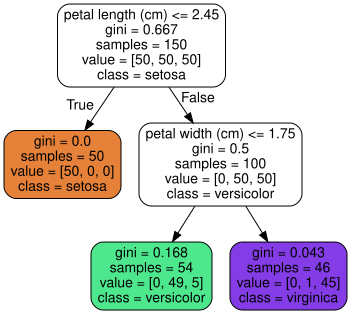

In [16]:
export_graphviz(
    tree_clf,
    out_file='iris_tree.dot',
    feature_names=['petal length (cm)', 'petal width (cm)'],
    class_names=iris.target_names,
    filled=True,
    rounded=True
)

from graphviz import Source

Source.from_file('iris_tree.dot')

**Samples --> Counts how many training instances it applies to** <br>
For example, 100 training instances have a petal length greater than 2.45 cm (depth 1, right), and of those 100, 54 have a petal width smaller than 1.75 cm (depth 2, left). 


**Values --> Tells how many training instances of each class this nodes applies to** <br>
A node’s value attribute tells you how many training instances of each class this node applies to: for example, the bottom-right node applies to 0 Iris setosa, 1 Iris versicolor,and 45 Iris virginica.

**Gini --> a node’s gini attribute measures its Gini impurity: a node is “pure” (gini=0) if all training instances it applies to belong to the same class.** <br>
For example, since the depth-1 left node applies only to Iris setosa training instances, it is pure and its Gini impurity is 0. Equation 6-1 shows how the training algorithm computes the Gini impurity Gi of the ith node. The depth-2 left node has a Gini impurity equal to $ 1 – (0/54)^2 – (49/54)^2 – (5/54)^2 ≈ 0.168. $


Equation 6-1 : Gini impurity formula
$$G_i = 1 - \sum_{k=1}^{n}{p_{i,k}^2}$$

where, <br> 
- $G_i$ is the gini impurity of the $i^{th}$ node
- $p_{i,k}$ is the ratio of class k instances among the training instances in the $i^{th}$ node


In [17]:
help(tree_clf.tree_)

Help on Tree object:

class Tree(builtins.object)
 |  Array-based representation of a binary decision tree.
 |  
 |  The binary tree is represented as a number of parallel arrays. The i-th
 |  element of each array holds information about the node `i`. Node 0 is the
 |  tree's root. You can find a detailed description of all arrays in
 |  `_tree.pxd`. NOTE: Some of the arrays only apply to either leaves or split
 |  nodes, resp. In this case the values of nodes of the other type are
 |  arbitrary!
 |  
 |  Attributes
 |  ----------
 |  node_count : int
 |      The number of nodes (internal nodes + leaves) in the tree.
 |  
 |  capacity : int
 |      The current capacity (i.e., size) of the arrays, which is at least as
 |      great as `node_count`.
 |  
 |  max_depth : int
 |      The depth of the tree, i.e. the maximum depth of its leaves.
 |  
 |  children_left : array of int, shape [node_count]
 |      children_left[i] holds the node id of the left child of node i.
 |      For leave

In [18]:
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [19]:
list(zip(iris.target_names, ("yo", "bs", "g^")))


[('setosa', 'yo'), ('versicolor', 'bs'), ('virginica', 'g^')]

In [20]:
X_iris[:,
       0]

array([1.4, 1.4, 1.3, 1.5, 1.4, 1.7, 1.4, 1.5, 1.4, 1.5, 1.5, 1.6, 1.4,
       1.1, 1.2, 1.5, 1.3, 1.4, 1.7, 1.5, 1.7, 1.5, 1. , 1.7, 1.9, 1.6,
       1.6, 1.5, 1.4, 1.6, 1.6, 1.5, 1.5, 1.4, 1.5, 1.2, 1.3, 1.4, 1.3,
       1.5, 1.3, 1.3, 1.3, 1.6, 1.9, 1.4, 1.6, 1.4, 1.5, 1.4, 4.7, 4.5,
       4.9, 4. , 4.6, 4.5, 4.7, 3.3, 4.6, 3.9, 3.5, 4.2, 4. , 4.7, 3.6,
       4.4, 4.5, 4.1, 4.5, 3.9, 4.8, 4. , 4.9, 4.7, 4.3, 4.4, 4.8, 5. ,
       4.5, 3.5, 3.8, 3.7, 3.9, 5.1, 4.5, 4.5, 4.7, 4.4, 4.1, 4. , 4.4,
       4.6, 4. , 3.3, 4.2, 4.2, 4.2, 4.3, 3. , 4.1, 6. , 5.1, 5.9, 5.6,
       5.8, 6.6, 4.5, 6.3, 5.8, 6.1, 5.1, 5.3, 5.5, 5. , 5.1, 5.3, 5.5,
       6.7, 6.9, 5. , 5.7, 4.9, 6.7, 4.9, 5.7, 6. , 4.8, 4.9, 5.6, 5.8,
       6.1, 6.4, 5.6, 5.1, 5.6, 6.1, 5.6, 5.5, 4.8, 5.4, 5.6, 5.1, 5.1,
       5.9, 5.7, 5.2, 5. , 5.2, 5.4, 5.1])

In [21]:
X_iris

array([[1.4, 0.2],
       [1.4, 0.2],
       [1.3, 0.2],
       [1.5, 0.2],
       [1.4, 0.2],
       [1.7, 0.4],
       [1.4, 0.3],
       [1.5, 0.2],
       [1.4, 0.2],
       [1.5, 0.1],
       [1.5, 0.2],
       [1.6, 0.2],
       [1.4, 0.1],
       [1.1, 0.1],
       [1.2, 0.2],
       [1.5, 0.4],
       [1.3, 0.4],
       [1.4, 0.3],
       [1.7, 0.3],
       [1.5, 0.3],
       [1.7, 0.2],
       [1.5, 0.4],
       [1. , 0.2],
       [1.7, 0.5],
       [1.9, 0.2],
       [1.6, 0.2],
       [1.6, 0.4],
       [1.5, 0.2],
       [1.4, 0.2],
       [1.6, 0.2],
       [1.6, 0.2],
       [1.5, 0.4],
       [1.5, 0.1],
       [1.4, 0.2],
       [1.5, 0.2],
       [1.2, 0.2],
       [1.3, 0.2],
       [1.4, 0.1],
       [1.3, 0.2],
       [1.5, 0.2],
       [1.3, 0.3],
       [1.3, 0.3],
       [1.3, 0.2],
       [1.6, 0.6],
       [1.9, 0.4],
       [1.4, 0.3],
       [1.6, 0.2],
       [1.4, 0.2],
       [1.5, 0.2],
       [1.4, 0.2],
       [4.7, 1.4],
       [4.5, 1.5],
       [4.9,

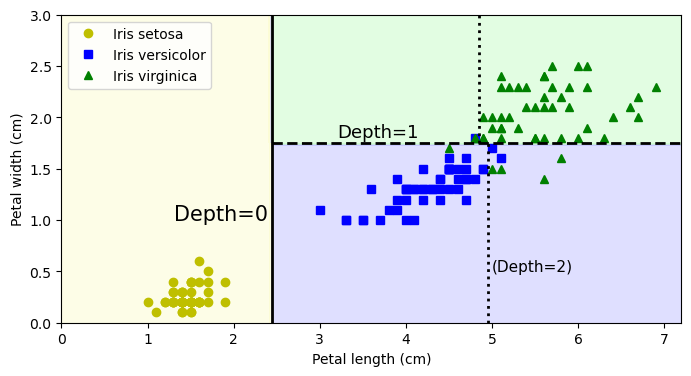

In [22]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.colors import ListedColormap
custom_cmap = ListedColormap(['#fafab0', '#9898ff', '#a0faa0'])
plt.figure(figsize=(8,4))

lengths, widths = np.meshgrid(np.linspace(0, 7.2, 100), np.linspace(0, 3, 100))
X_iris_all = np.c_[lengths.ravel(), widths.ravel()]

y_pred = tree_clf.predict(X_iris_all).reshape(lengths.shape)
plt.contourf(lengths, widths, y_pred, alpha=0.3, cmap=custom_cmap)

for idx, (name, style) in enumerate(zip(iris.target_names, ("yo", "bs", "g^"))):
    plt.plot(X_iris[:,0][y_iris == idx], X_iris[: ,1][y_iris == idx], style, label=f"Iris {name}")
    
tree_clf_deeper = DecisionTreeClassifier(max_depth=3, random_state=42)

tree_clf_deeper.fit(X_iris, y_iris)


export_graphviz(
    tree_clf_deeper,
    out_file='iris_tree.dot',
    feature_names=['petal length (cm)', 'petal width (cm)'],
    class_names=iris.target_names,
    filled=True,
    rounded=True
)

from graphviz import Source

Source.from_file('iris_tree.dot')


th0, th1, th2a, th2b = tree_clf_deeper.tree_.threshold[[0, 2, 3, 6]]

plt.xlabel("Petal length (cm)")
plt.ylabel("Petal width (cm)")

plt.plot([th0, th0], [0,3], "k-", linewidth=2)

    
    # print(idx, X_iris[:, 0][y_i

# for idx, (name, style) in enumerate(zip(iris.target_names, ("yo", "bs", "g^"))):
#     plt.plot(X_iris[:, 0][y_iris == idx], X_iris[:, 1][y_iris == idx],
#              style, label=f"Iris {name}")
    
#     tree_clf_deeper = DecisionTreeClassifier(max_depth=3, random_state=42)
# tree_clf_deeper.fit(X_iris, y_iris)
# th0, th1, th2a, th2b = tree_clf_deeper.tree_.threshold[[0, 2, 3, 6]]
# plt.xlabel("Petal length (cm)")
# plt.ylabel("Petal width (cm)")
# plt.plot([th0, th0], [0, 3], "k-", linewidth=2)
plt.plot([th0, 7.2], [th1, th1], "k--", linewidth=2)
plt.plot([th2a, th2a], [0, th1], "k:", linewidth=2)
plt.plot([th2b, th2b], [th1, 3], "k:", linewidth=2)
plt.text(th0 - 0.05, 1.0, "Depth=0", horizontalalignment="right", fontsize=15)
plt.text(3.2, th1 + 0.02, "Depth=1", verticalalignment="bottom", fontsize=13)
plt.text(th2a + 0.05, 0.5, "(Depth=2)", fontsize=11)
plt.axis([0, 7.2, 0, 3])
plt.legend()
# # save_fig("decision_tree_decision_boundaries_plot")

# plt.show()

In [23]:
tree_clf_deeper.tree_.threshold

array([ 2.44999999, -2.        ,  1.75      ,  4.95000005, -2.        ,
       -2.        ,  4.85000014, -2.        , -2.        ])

In [24]:
tree_clf_deeper.tree_.threshold[[0, 2, 3, 6]]

array([2.44999999, 1.75      , 4.95000005, 4.85000014])

In [25]:
np.meshgrid(np.linspace(0, 7.2, 100), np.linspace(0, 3, 100))

[array([[0.        , 0.07272727, 0.14545455, ..., 7.05454545, 7.12727273,
         7.2       ],
        [0.        , 0.07272727, 0.14545455, ..., 7.05454545, 7.12727273,
         7.2       ],
        [0.        , 0.07272727, 0.14545455, ..., 7.05454545, 7.12727273,
         7.2       ],
        ...,
        [0.        , 0.07272727, 0.14545455, ..., 7.05454545, 7.12727273,
         7.2       ],
        [0.        , 0.07272727, 0.14545455, ..., 7.05454545, 7.12727273,
         7.2       ],
        [0.        , 0.07272727, 0.14545455, ..., 7.05454545, 7.12727273,
         7.2       ]]),
 array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.03030303, 0.03030303, 0.03030303, ..., 0.03030303, 0.03030303,
         0.03030303],
        [0.06060606, 0.06060606, 0.06060606, ..., 0.06060606, 0.06060606,
         0.06060606],
        ...,
        [2.93939394, 2.93939394, 2.93939394, ..., 2.93939394, 2.93939394,
         2.93939394],
        [2.9

In [26]:
lengths, widths = np.meshgrid(np.linspace(0, 7.2, 100), np.linspace(0, 3, 100))
lengths.shape


(100, 100)

In [27]:
np.linspace(0, 7.2, 100)

array([0.        , 0.07272727, 0.14545455, 0.21818182, 0.29090909,
       0.36363636, 0.43636364, 0.50909091, 0.58181818, 0.65454545,
       0.72727273, 0.8       , 0.87272727, 0.94545455, 1.01818182,
       1.09090909, 1.16363636, 1.23636364, 1.30909091, 1.38181818,
       1.45454545, 1.52727273, 1.6       , 1.67272727, 1.74545455,
       1.81818182, 1.89090909, 1.96363636, 2.03636364, 2.10909091,
       2.18181818, 2.25454545, 2.32727273, 2.4       , 2.47272727,
       2.54545455, 2.61818182, 2.69090909, 2.76363636, 2.83636364,
       2.90909091, 2.98181818, 3.05454545, 3.12727273, 3.2       ,
       3.27272727, 3.34545455, 3.41818182, 3.49090909, 3.56363636,
       3.63636364, 3.70909091, 3.78181818, 3.85454545, 3.92727273,
       4.        , 4.07272727, 4.14545455, 4.21818182, 4.29090909,
       4.36363636, 4.43636364, 4.50909091, 4.58181818, 4.65454545,
       4.72727273, 4.8       , 4.87272727, 4.94545455, 5.01818182,
       5.09090909, 5.16363636, 5.23636364, 5.30909091, 5.38181

In [28]:
np.c_[lengths.ravel(), widths.ravel()].shape

(10000, 2)

In [29]:
tree_clf.predict_proba([[5, 1.5]]).round(3)

array([[0.   , 0.907, 0.093]])

In [30]:
tree_clf.predict([[5, 1.5]])

array([1])

In [31]:
from sklearn.datasets import make_moons

X_moons, y_moons = make_moons(n_samples=150, noise=0.2, random_state=42)

In [32]:
X_moons.shape
y_moons.shape

(150,)

In [33]:
y_moons

array([0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1])

In [34]:
tree_clf1 = DecisionTreeClassifier(random_state=42)
tree_clf1.fit(X_moons, y_moons)

DecisionTreeClassifier(random_state=42)

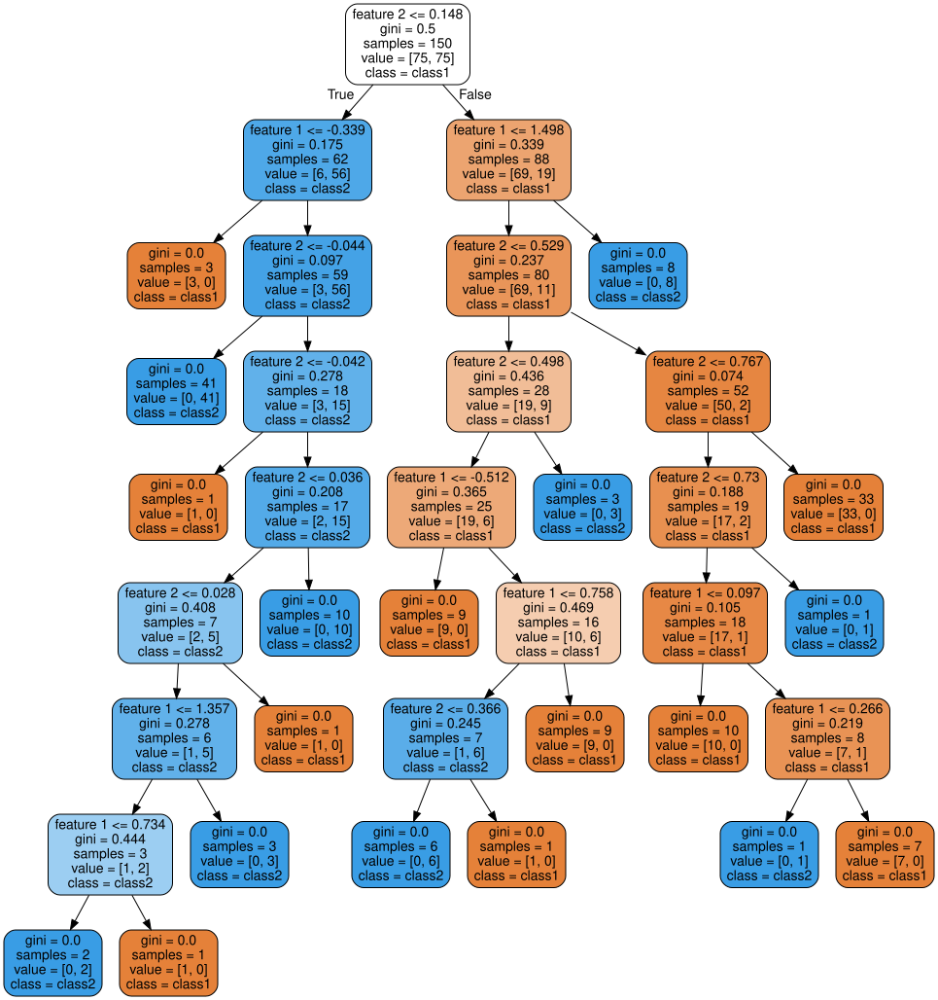

In [35]:
export_graphviz(
    tree_clf1,
    out_file='moon_clf_1.dot',
    feature_names=['feature 1', 'feature 2'],
    class_names=['class1', 'class2'],
    filled=True,
    rounded=True
)

from graphviz import Source

Source.from_file('moon_clf_1.dot')

In [36]:
tree_clf2 = DecisionTreeClassifier(min_samples_leaf=5, random_state=42)

In [37]:
tree_clf2.fit(X_moons, y_moons)

DecisionTreeClassifier(min_samples_leaf=5, random_state=42)

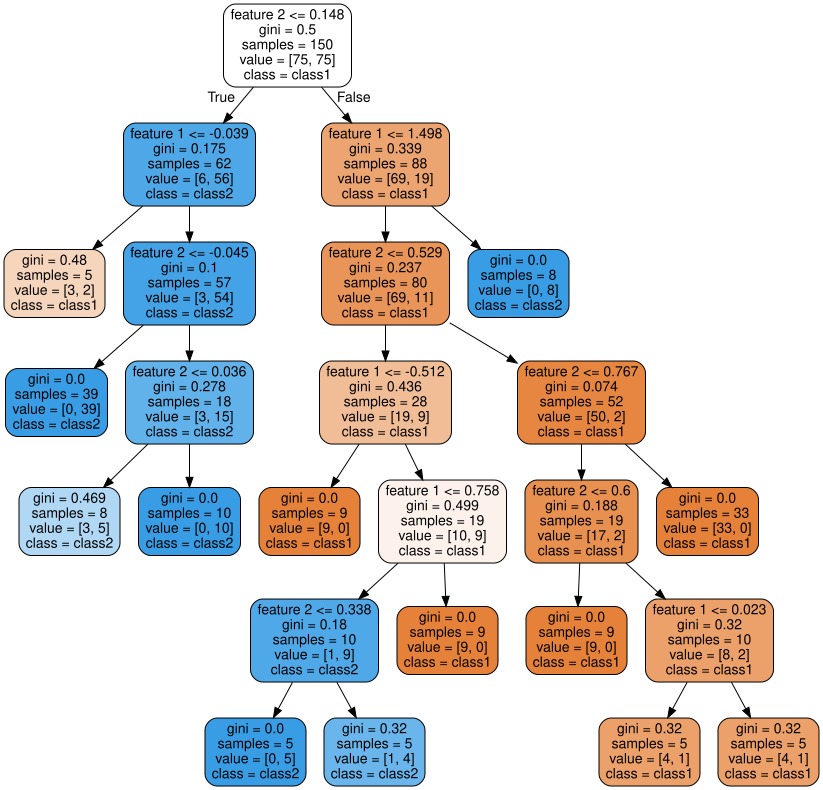

In [38]:
export_graphviz(
    tree_clf2,
    out_file='moon_clf_2.dot',
    feature_names=['feature 1', 'feature 2'],
    class_names=['class1', 'class2'],
    filled=True,
    rounded=True
)


Source.from_file('moon_clf_2.dot')

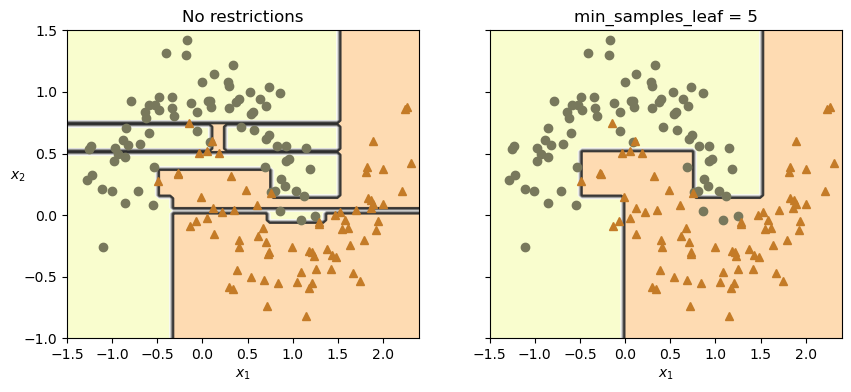

In [39]:
# extra code – this cell generates and saves Figure 6–3

def plot_decision_boundary(clf, X, y, axes, cmap):
    x1, x2 = np.meshgrid(np.linspace(axes[0], axes[1], 100),
                         np.linspace(axes[2], axes[3], 100))
    X_new = np.c_[x1.ravel(), x2.ravel()]
    y_pred = clf.predict(X_new).reshape(x1.shape)
    
    plt.contourf(x1, x2, y_pred, alpha=0.3, cmap=cmap)
    plt.contour(x1, x2, y_pred, cmap="Greys", alpha=0.8)
    colors = {"Wistia": ["#78785c", "#c47b27"], "Pastel1": ["red", "blue"]}
    markers = ("o", "^")
    for idx in (0, 1):
        plt.plot(X[:, 0][y == idx], X[:, 1][y == idx],
                 color=colors[cmap][idx], marker=markers[idx], linestyle="none")
    plt.axis(axes)
    plt.xlabel(r"$x_1$")
    plt.ylabel(r"$x_2$", rotation=0)

fig, axes = plt.subplots(ncols=2, figsize=(10, 4), sharey=True)
plt.sca(axes[0])
plot_decision_boundary(tree_clf1, X_moons, y_moons,
                       axes=[-1.5, 2.4, -1, 1.5], cmap="Wistia")
plt.title("No restrictions")
plt.sca(axes[1])
plot_decision_boundary(tree_clf2, X_moons, y_moons,
                       axes=[-1.5, 2.4, -1, 1.5], cmap="Wistia")
plt.title(f"min_samples_leaf = {tree_clf2.min_samples_leaf}")
plt.ylabel("")
# save_fig("min_samples_leaf_plot")
plt.show()

In [40]:
X_moons_test, y_moons_test = make_moons(n_samples=1000, noise=0.2, random_state=43)

In [41]:
tree_clf1.score(X_moons_test, y_moons_test)

0.898

In [42]:
tree_clf2.score(X_moons_test, y_moons_test)

0.92

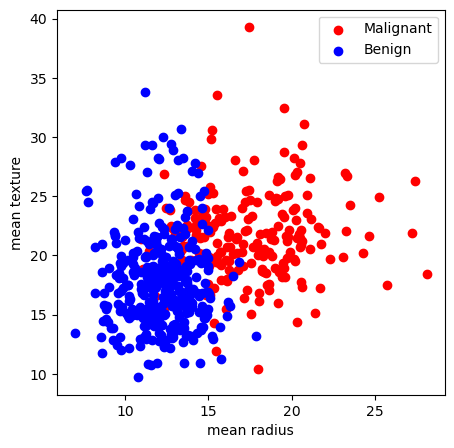

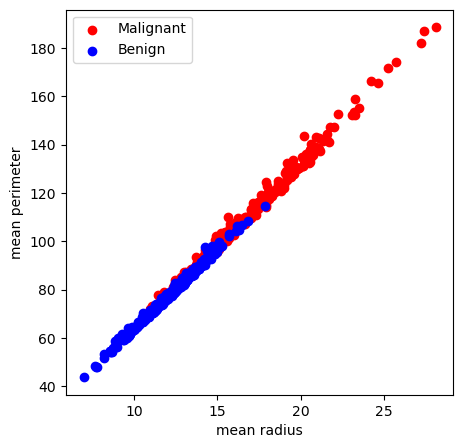

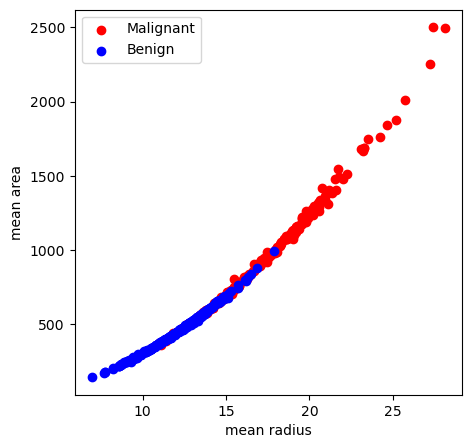

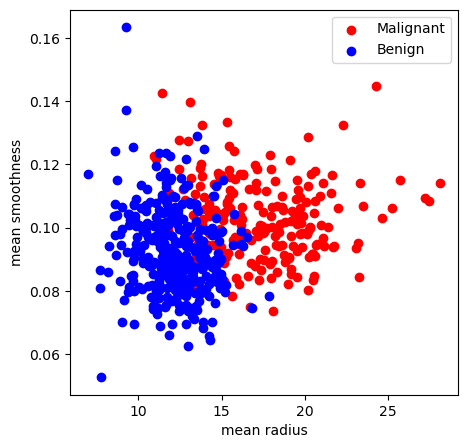

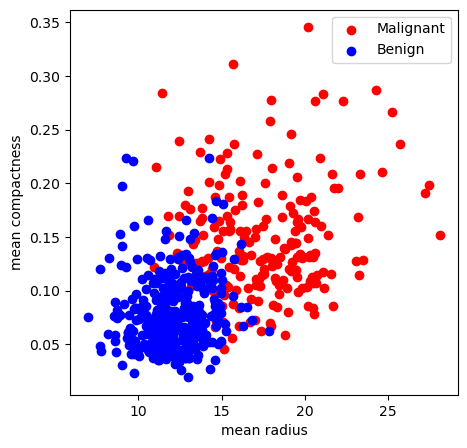

...

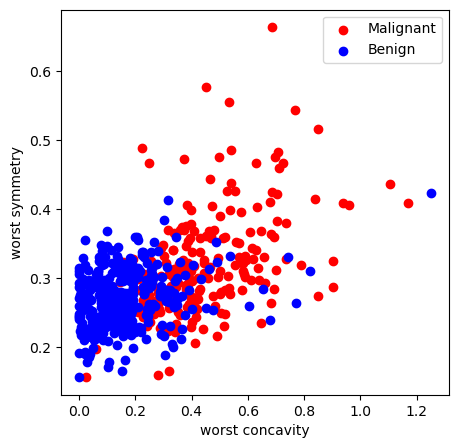

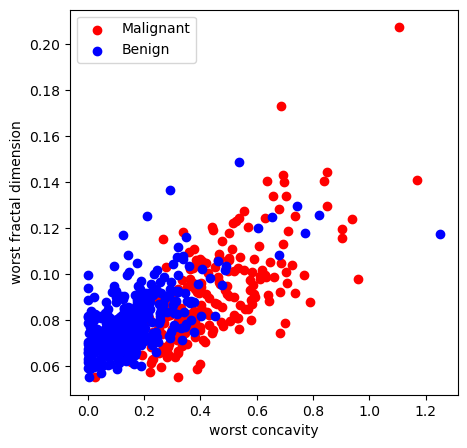

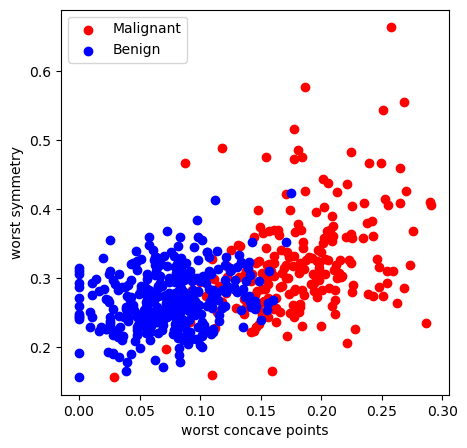

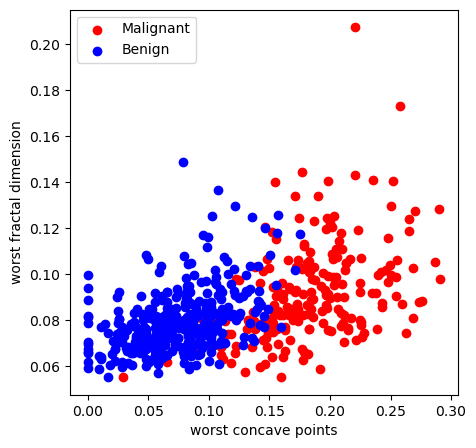

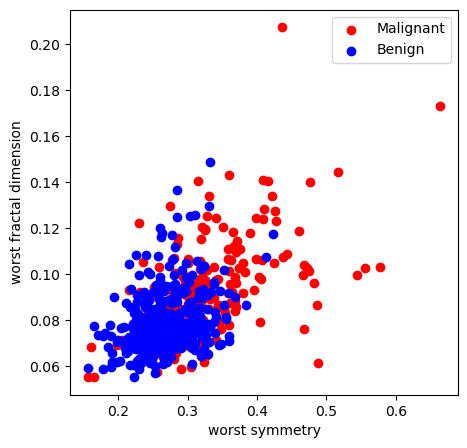

In [43]:
# import matplotlib.pyplot as plt
# import numpy as np
# from sklearn.datasets import load_breast_cancer

# data = load_breast_cancer()
# X, y = data.data, data.target

# # Create pairwise scatter plots of the features
# for i in range(X.shape[1]):
#     for j in range(i+1, X.shape[1]):
#         plt.figure(figsize=(5,5))
#         plt.scatter(X[:,i][y==0], X[:,j][y==0], color='red', label='Malignant')
#         plt.scatter(X[:,i][y==1], X[:,j][y==1], color='blue', label='Benign')
#         plt.xlabel(data.feature_names[i])
#         plt.ylabel(data.feature_names[j])
#         plt.legend()
#         plt.show()

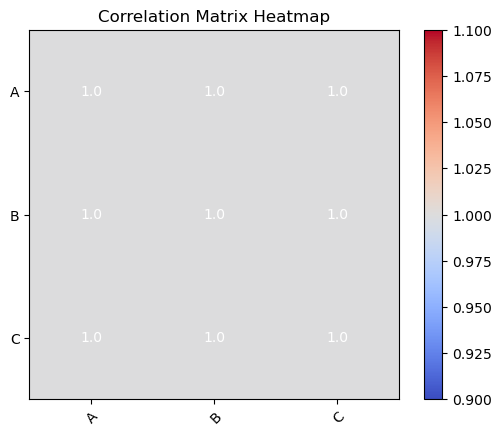

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# create a sample dataframe
data = {'A': [1, 2, 3, 4, 5], 'B': [6, 7, 8, 9, 10], 'C': [11, 12, 13, 14, 15]}
df = pd.DataFrame(data)

# calculate the correlation matrix
corr_matrix = df.corr()

# create the heatmap plot
fig, ax = plt.subplots()
im = ax.imshow(corr_matrix, cmap='coolwarm')

# add a colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# set the axis labels
ax.set_xticks(np.arange(len(corr_matrix.columns)))
ax.set_yticks(np.arange(len(corr_matrix.columns)))
ax.set_xticklabels(corr_matrix.columns)
ax.set_yticklabels(corr_matrix.columns)

# rotate the tick labels and set their alignment
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# add the correlation coefficients in each cell of the heatmap
for i in range(len(corr_matrix.columns)):
    for j in range(len(corr_matrix.columns)):
        text = ax.text(j, i, round(corr_matrix.iloc[i, j], 2), ha="center", va="center", color="w")

# set the title
ax.set_title("Correlation Matrix Heatmap")

# show the plot
plt.show()


In [46]:
import pandas as pd

# Load the breast cancer dataset
from sklearn.datasets import load_breast_cancer
breast_cancer_data = load_breast_cancer()
breast_cancer_feature_matrix = pd.DataFrame(breast_cancer_data['data'], columns=breast_cancer_data['feature_names'])

# Create a correlation matrix
corr_matrix = breast_cancer_feature_matrix.corr().abs()

# Get the highly correlated features
threshold = 0.85
high_corr_features = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if corr_matrix.iloc[i, j] >= threshold:
            colname = corr_matrix.columns[i]
            high_corr_features.add(colname)

print(f"Highly correlated features: {high_corr_features}")

Highly correlated features: {'worst compactness', 'mean area', 'worst radius', 'mean concavity', 'area error', 'perimeter error', 'worst texture', 'worst perimeter', 'mean concave points', 'mean perimeter', 'worst area', 'worst concave points', 'worst concavity'}


In [47]:
import numpy as np

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.85)]



print(to_drop)

# drop highly correlated features
# .drop(to_drop, axis=1, inplace=True)

['mean perimeter', 'mean area', 'mean concavity', 'mean concave points', 'perimeter error', 'area error', 'worst radius', 'worst texture', 'worst perimeter', 'worst area', 'worst compactness', 'worst concavity', 'worst concave points']


In [48]:
# create correlation matrix
# corr_matrix = df.corr().abs()

# select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# find index of feature columns with correlation less than 0.1
to_drop = [column for column in upper.columns if any(upper[column] < 0.1)]

print(to_drop)
# # drop non-correlated features
# df.drop(to_drop, axis=1, inplace=True)

['mean smoothness', 'mean symmetry', 'mean fractal dimension', 'radius error', 'texture error', 'perimeter error', 'area error', 'smoothness error', 'symmetry error', 'fractal dimension error', 'worst radius', 'worst texture', 'worst perimeter', 'worst area', 'worst smoothness', 'worst compactness', 'worst concavity', 'worst concave points', 'worst symmetry', 'worst fractal dimension']


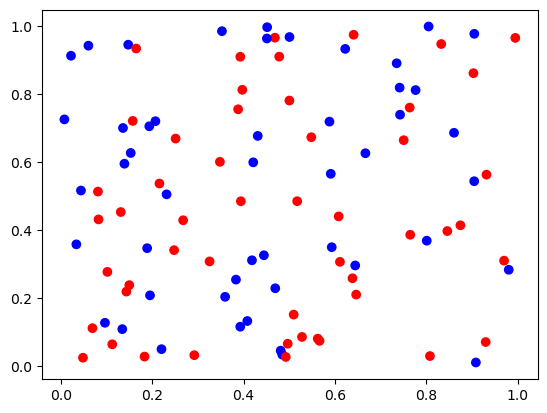

In [49]:
import matplotlib.pyplot as plt
import numpy as np

# generate some data
x = np.random.rand(100)
y = np.random.rand(100)
predicted_output = np.random.rand(100)

# create a scatter plot
plt.scatter(x, y, c=np.where(predicted_output > 0.5, 'r', 'b'))

# show the plot
plt.show()

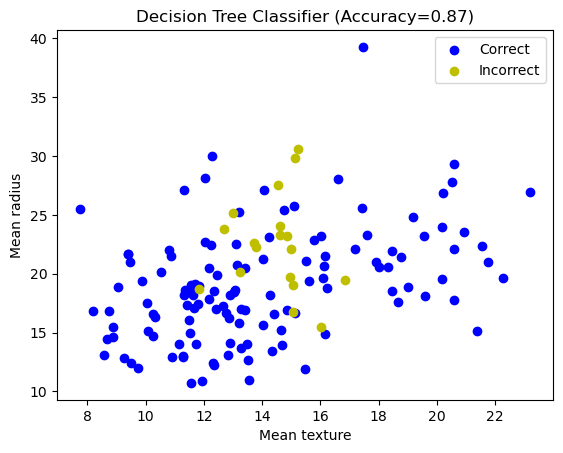

In [50]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Load the breast cancer dataset
data = load_breast_cancer()

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data.data[:, [0, 1]], data.target, random_state=0)

# Train a decision tree classifier on the training data
clf = DecisionTreeClassifier().fit(X_train, y_train)

# Make predictions on the test data
y_pred = clf.predict(X_test)

# Calculate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)

# Get the indices of correctly and incorrectly predicted data points
correct_indices = (y_pred == y_test)
incorrect_indices = (y_pred != y_test)



# Create a scatter plot of the data points
plt.scatter(X_test[correct_indices, 0], X_test[correct_indices, 1], c='b', label='Correct')
plt.scatter(X_test[incorrect_indices, 0], X_test[incorrect_indices, 1], c='y', label='Incorrect')

# Add a legend and axis labels
plt.legend()
plt.xlabel('Mean texture')
plt.ylabel('Mean radius')
plt.title('Decision Tree Classifier (Accuracy={:.2f})'.format(accuracy))

# Show the plot
plt.show()


In [51]:
correct_indices

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False,  True, False,  True,  True,  True,  True,
        True,  True, False,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True,  True,  True, False,  True,  True,  True, False,
        True,  True,  True,  True, False,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True, False, False,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

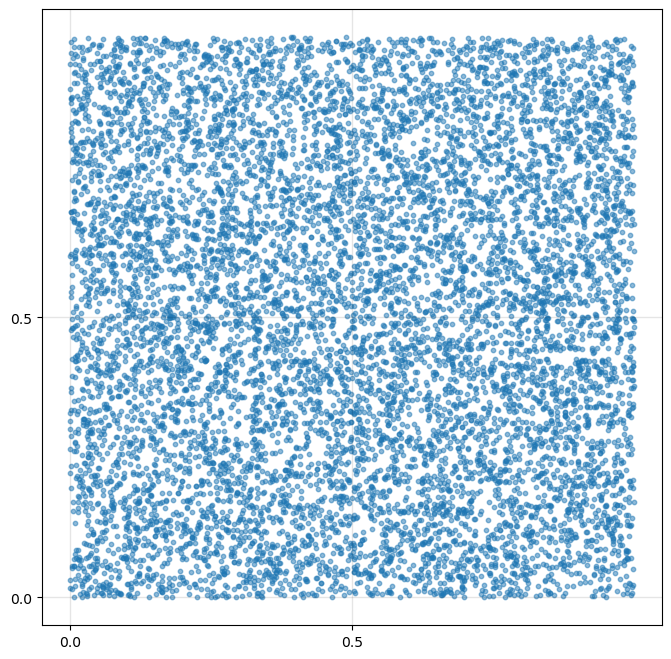

In [52]:
import numpy as np
import matplotlib.pyplot as plt

# Generate random x and y values
x = np.random.rand(10000)
y = np.random.rand(10000)

# Create a scatter plot with more cells
fig, ax = plt.subplots(figsize=(8, 8))
ax.scatter(x, y, s=10, alpha=0.5)

# Customize the grid size and display
grid_size = 0.5
ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=1, alpha=0.1, zorder=0)
ax.set_xticks(np.arange(0, 1, grid_size))
ax.set_yticks(np.arange(0, 1, grid_size))
ax.set_xticklabels(np.arange(0, 1, grid_size))
ax.set_yticklabels(np.arange(0, 1, grid_size))

plt.show()


In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.svm import LinearSVR
from sklearn.ensemble import VotingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

# Data Cleaning and Preparation
def clean_data(file_path):
    df = pd.read_csv(file_path)
    # df.drop(['No', 'Flow(cm)', 'Air(cm)'], axis=1, inplace=True)
    # Dropping these columns as they are not needed for predicting Compressive Strength
    return df

# Load and Clean Data
data = clean_data('./slump_test.data')

# Splitting into Train and Test sets
X = data.drop(['Compressive Strength (28-day)(Mpa)'], axis=1)
y = data['Compressive Strength (28-day)(Mpa)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Base Estimators
svm = LinearSVR()
linear = LinearRegression()
sgd = SGDRegressor()

# Voting Regressor
voting_regressor = VotingRegressor(estimators=[('svm', svm), ('linear', linear), ('sgd', sgd)])

# Training the models
svm.fit(X_train, y_train)
linear.fit(X_train, y_train)
sgd.fit(X_train, y_train)
voting_regressor.fit(X_train, y_train)

# Evaluating the models
models = [svm, linear, sgd, voting_regressor]
model_names = ['Linear SVM', 'Linear Regression', 'SGD', 'Voting Regressor']
for i, model in enumerate(models):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    print(f"{model_names[i]} RMSE: {rmse:.2f}")

# Hyperparameter Tuning
param_grid_svm = {'C': [0.1, 1, 10]}
svm_tuned = GridSearchCV(LinearSVR(), param_grid_svm, cv=3)
svm_tuned.fit(X_train, y_train)

param_grid_linear = {'fit_intercept': [True, False]}
linear_tuned = GridSearchCV(LinearRegression(), param_grid_linear, cv=3)
linear_tuned.fit(X_train, y_train)

param_grid_sgd = {'loss': ['squared_loss', 'huber'], 'alpha': [0.0001, 0.001, 0.01, 0.1]}
sgd_tuned = GridSearchCV(SGDRegressor(), param_grid_sgd, cv=3)
sgd_tuned.fit(X_train, y_train)

# Voting Regressor with Tuned Base Estimators
voting_regressor_tuned = VotingRegressor(estimators=[('svm', svm_tuned), ('linear', linear_tuned), ('sgd', sgd_tuned)])
voting_regressor_tuned.fit(X_train, y_train)

# Evaluating the Tuned Models
tuned_models = [svm_tuned, linear_tuned, sgd_tuned, voting_regressor_tuned]
tuned_model_names = ['Linear SVM Tuned', 'Linear Regression Tuned', 'SGD Tuned', 'Voting Regressor Tuned']
for i, model in enumerate(tuned_models):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))


Linear SVM RMSE: 2.08
Linear Regression RMSE: 2.07
SGD RMSE: 204143632008726.31
Voting Regressor RMSE: 693394299809418.12


/Users/pshre/opt/anaconda3/envs/MachineLearningLabs/lib/python3.9/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/pshre/opt/anaconda3/envs/MachineLearningLabs/lib/python3.9/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/pshre/opt/anaconda3/envs/MachineLearningLabs/lib/python3.9/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/pshre/opt/anaconda3/envs/MachineLearningLabs/lib/python3.9/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/pshre/opt/anaconda3/envs/MachineLearningLabs/lib/python3.9/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increas

In [54]:
import numpy as np
from sklearn.tree import DecisionTreeRegressor

np.random.seed(42)

In [55]:
X_quad = np.random.rand(200,1) - 0.5

In [56]:
y_quad = X_quad ** 2 + 0.025 * np.random.randn(200, 1)

In [57]:
tree_reg = DecisionTreeRegressor(max_depth=2, random_state=42)

In [58]:
tree_reg

DecisionTreeRegressor(max_depth=2, random_state=42)

In [59]:
tree_reg.fit(X_quad, y_quad)

DecisionTreeRegressor(max_depth=2, random_state=42)

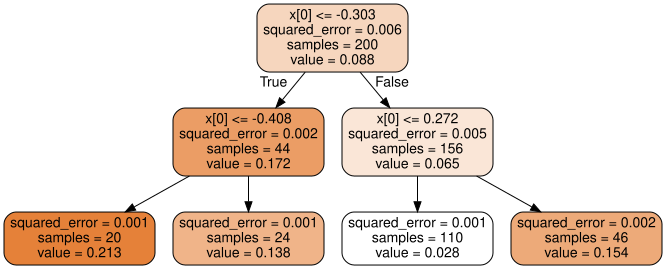

In [60]:
from sklearn.tree import export_graphviz

export_graphviz(
    tree_reg,
    out_file='tree_reg.dot',
    # feature_names=X.columns,
    # class_names=breast_cancer_data.target_names,
    filled=True,
    rounded=True
)

from graphviz import Source

Source.from_file('tree_reg.dot')

In [63]:
from sklearn.ensemble import BaggingClassifier

from sklearn.tree import DecisionTreeClassifier

bag_clf = BaggingClassifier(DecisionTreeClassifier(), n_estimators=500, max_samples=100, random_state=42)
bag_clf.fit(X_train, y_train)

ValueError: Unknown label type: 'continuous'

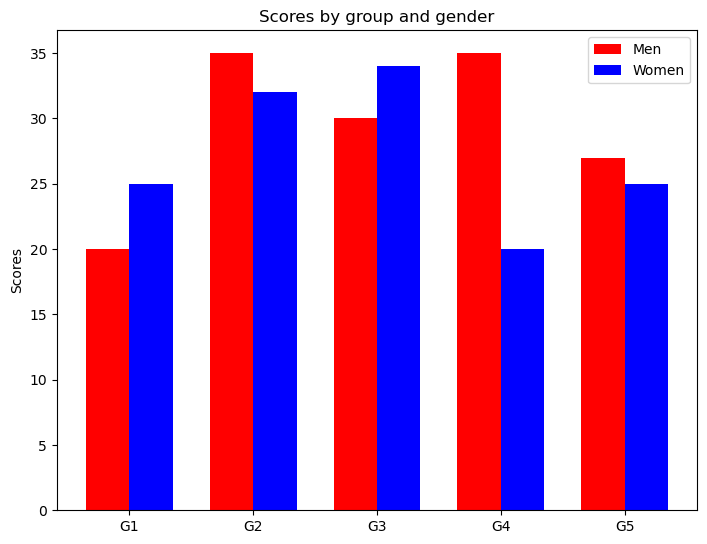

In [64]:
import numpy as np
import matplotlib.pyplot as plt
 
# Data
N = 5
men_means = (20, 35, 30, 35, 27)
women_means = (25, 32, 34, 20, 25)
 
ind = np.arange(N)  # the x locations for the groups
width = 0.35       # the width of the bars
 
# Plotting
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
rects1 = ax.bar(ind, men_means, width, color='r')
rects2 = ax.bar(ind + width, women_means, width, color='b')
 
# Add labels, title, and legend
ax.set_ylabel('Scores')
ax.set_title('Scores by group and gender')
ax.set_xticks(ind + width / 2)
ax.set_xticklabels(('G1', 'G2', 'G3', 'G4', 'G5'))
ax.legend((rects1[0], rects2[0]), ('Men', 'Women'))
 
plt.show()
